By Prof. Seungchul Lee  
http://iai.postech.ac.kr/  
Industrial AI Lab at POSTECH  
(Translate to R by Gwangil Seo)

Table of Contents

   * [1. Discrete Time Signals](#1.-Discrete-Time-Signals)
      + [1.1. Plot Real Signals](#1.1.-Plot-Real-Signals)
      + [1.2. Signal Sounds](#1.2.-Signal-Sounds)
   * [2. Complex Signals](#2.-Complex-Signals)
      + [2.1. ComplexNumbers](#2.1.-ComplexNumbers)
         - [2.1.1. Adding Complex Numbers](#2.1.1.-Adding-Complex-Numbers)
         - [2.1.2. Complex Exponential Function (Euler's Formular)](#2.1.2.-Complex-Exponential-Function-(Euler's-Formular))
         - [2.1.3. Multiplying/Dividing Complex Numbers](#2.1.3.-Multiplying/Dividing-Complex-Numbers)
      + [2.2. Circular Motion Represented by Complex Number](#2.2.-Circular-Motion-Represented-by-Complex-Number)
         - [2.2.1. Geometrical Meaning of $e^{i\theta}$](#2.2.1.-Geometrical-Meaning-of-$e^{i\theta}$)
         - [2.2.2. Geometrical Meaning of $e^{iwt}$](#2.2.2.-Geometrical-Meaning-of-$e^{iwt}$)
      + [2.3. Sinusoidal Functions from Circular Motions (sin & cos)](#2.3.-Sinusoidal-Functions-from-Circular-Motions-(sin-&-cos))
   * [3. Discrete Sinusoids](#3.-Discrete-Sinusoids)
      + [3.1. Frequency in Discrete Sinusoids](#3.1.-Frequency-in-Discrete-Sinusoids)
      + [3.2. Aliasing](#3.2.-Aliasing)
   * [4. Complex Exponential Signals](#4.-Complex-Exponential-Signals)
      + [4.1. Damped Free Oscillation](#4.1.-Damped-Free-Oscillation)

## 1. Discrete Time Signals

A __signal $x[n]$__ is a function that maps an independent variable to a dependent variable.

In this course, we will focus on discrete-time signals $x[n]$ :

 - Independent variable is an integer: $n \in \mathbb{Z}$
 - Dependent variable is a real or complex number: $x[n] \in \mathbb{R}\ \text{or}\ \mathbb{C}$


### 1.1. Plot Real Signals

 - plot for continuous signals in MATLAB $\Rightarrow$ plot(type = 'l') for continuous signals in R

 - stem for discrete signals in MATLAB $\Rightarrow$ plot & arrows & abline for discreate signals in R
 
$$
x(t) = \text{sin}(2\pi t)
$$

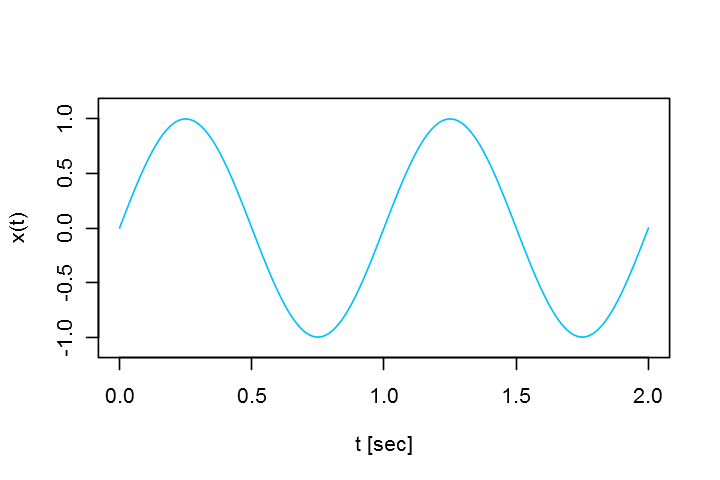

In [1]:
t <- seq(0, 2, 0.01)
x <- sin(2 * pi * t)

options(repr.plot.width=6, repr.plot.height=4)
plot(t, x, type = 'l', lwd = 1, col = 'deepskyblue', ylim = c(-1.1, 1.1), xlab = 't [sec]', ylab = 'x(t)')

$$
x[n] = \text{sin}\left({2\pi\over N} n\right)
$$

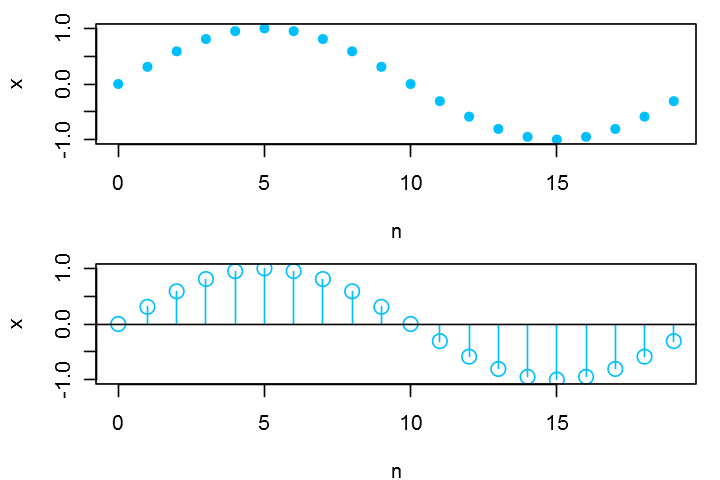

In [2]:
N <- 20
n <- 0:(N-1)
x <- sin(2 * pi/N * n)

par(mfrow = c(2, 1), mar = c(4, 4, 1, 1))
plot(n, x, pch = 16, col = 'deepskyblue')

plot(n, x, col = 'deepskyblue', cex = 1.5)
arrows(x0 = n, y0 = 0, x1 = n, y1 = x, col = 'deepskyblue', length = 0, angle = 0, lwd = 1)
abline(h = 0)

### 1.2. Signal Sounds

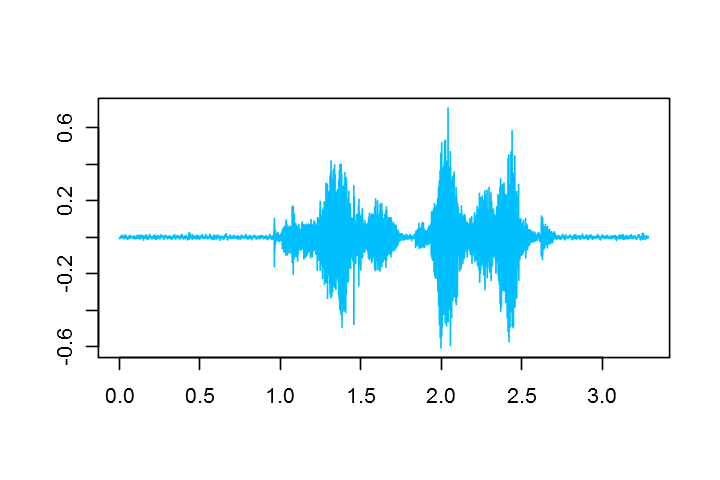

In [3]:
fs <- 44100  # sampling frequency
N <- 145000  # # of data points

# signal: "Alas, Poor Yorick!"
alas <- R.matlab::readMat("../data_files/hamlet.mat")$alas
hamlet <- 2 * alas[1:N]

plot(0:(N - 1) / fs, hamlet, type = 'l', lwd = 1, col = 'deepskyblue', xlab = "", ylab = "")

In [4]:
sound <- function(data, samp.rate) {
  W <- tuneR::normalize(tuneR::Wave(data, samp.rate = samp.rate, bit = 16), unit = "16")
  tuneR::play(W)
}

sound(hamlet, fs)

$$
x[n] = \text{cos}\left( {2\pi \over 200} n \right)
$$

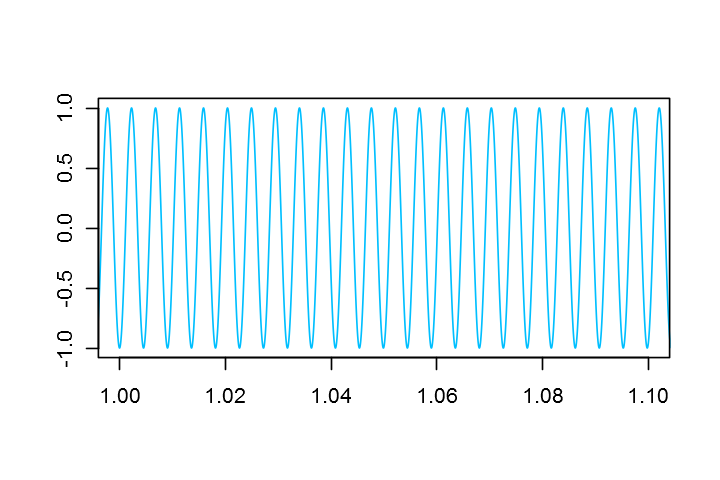

In [5]:
# cosine wave
n <- 0:(N - 1)
coswave <- cos(2 * pi / 200 * n)
plot(n / fs, coswave, type = 'l', lwd = 1, col = 'deepskyblue', xlim = c(1, 1.1), xlab = "", ylab = "")

sound(coswave, fs)

Chirp
$$
x[n] = 0.3\text{cos}\left({2\pi \over 3000000} n ^ 2\right)
$$

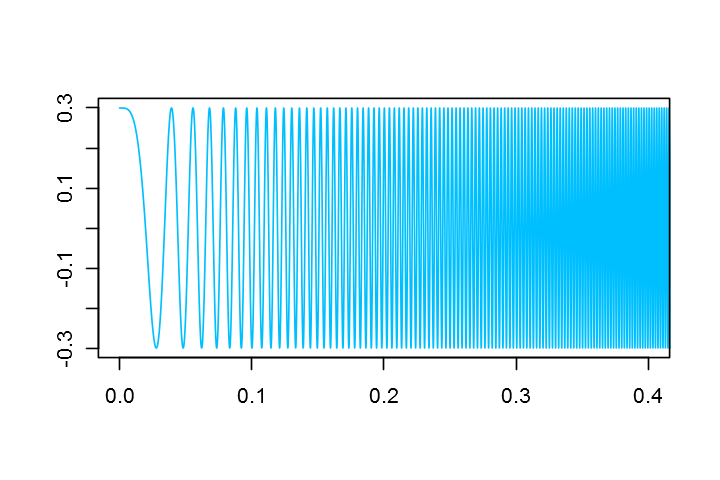

In [6]:
# chirp (https://en.wikipedia.org/wiki/Chirp)
chirp <- 0.3 * cos(2 * pi / 3000000 * n ^ 2)
plot(n / fs, chirp, type = 'l', lwd = 1, col = 'deepskyblue', xlim = c(0, 0.4), xlab = "", ylab = "")

sound(chirp, fs)

whitenoise

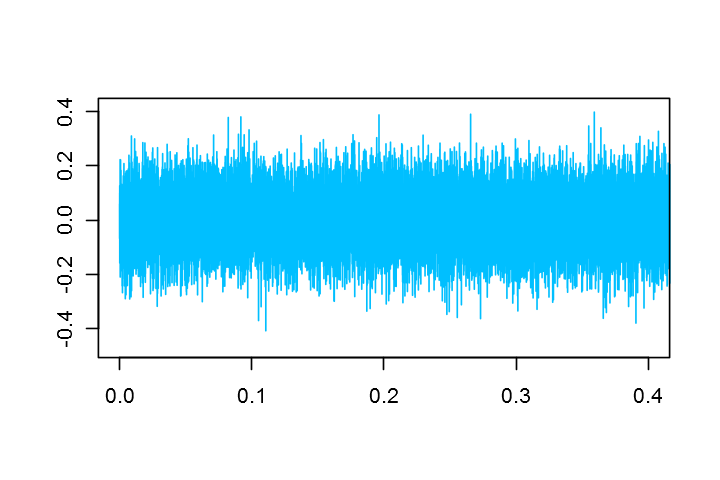

In [7]:
# white gaussian noise
whitenoise <- 0.1 * rnorm(N, 0, 1)
plot(n / fs, whitenoise, type = 'l', lwd = 1, col = 'deepskyblue', xlim = c(0, 0.4), xlab = "", ylab = "")

sound(whitenoise, fs)

## 2. Complex Signals

### 2.1. ComplexNumbers

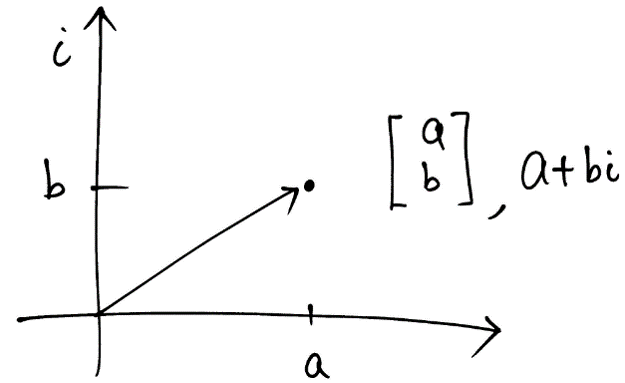

$$\text{Complex number = vector in 2D}$$

#### 2.1.1. Adding Complex Numbers

$$
z_1 = a_1 + ib_1, \quad  \vec z_1 = \left[ \begin{array}
{r}
a_1 \\
b_1
\end{array} \right]
\\
z_2 = a_2 + ib_2, \quad  \vec z_2 = \left[ \begin{array}
{r}
a_2 \\
b_2
\end{array} \right]
$$

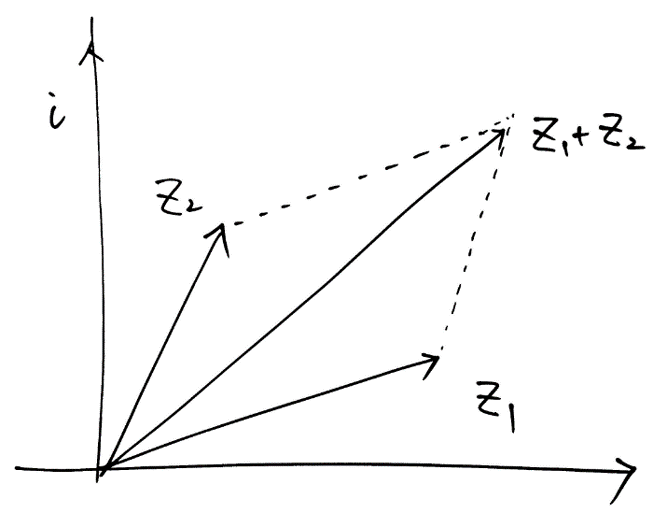


$$\begin{align}
z &= z_1 + z_2 = (a_1 + a_2) + i(b_1 + b_2) \\
\vec z &= \vec z_1 + \vec z_2 = \left[ \begin{array} {r}a_1\\b_1\end{array} \right] + \left[ \begin{array} {r} a_2 \\ b_2 \end{array} \right] = \left[\begin{array}{r}a_1 + a_2 \\ b_1 + b_2 \end{array} \right]
\end{align}
$$

#### 2.1.2. Complex Exponential Function (Euler's Formular)

$$
e^{i\theta} = \text{cos}\theta + i \text{sin}\theta
$$

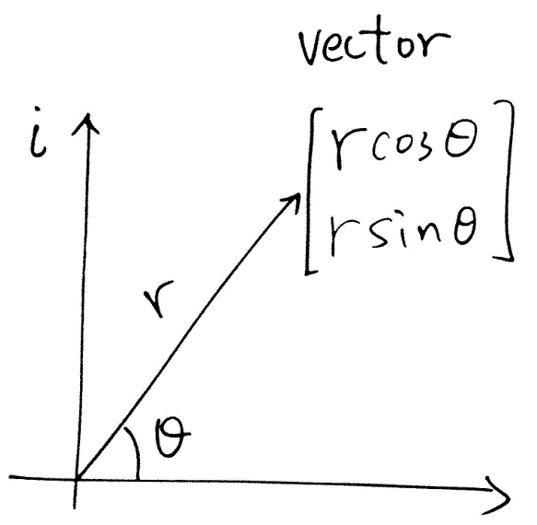

<center>
$\vec z = r\text{cos}\theta + ir\text{sin}\theta \\ \vec z = re^{i\theta} = r(\text{cos}\theta + i\text{sin}\theta) \\ r : \text{magnitude (length)}\\ \theta : \text{phase (angle)}$
</center>

#### 2.1.3. MUltiplying/Dividing Complex Numbers
  - Just like an exponential function

$$
z_1 = r_1e^{i\theta_1} \qquad \Longrightarrow \qquad z_1 \dot\\z_2 = r_1r_2e^{i(\theta_1 + \theta_2)} \\
z_2 = r_2e^{i\theta_2} \qquad \Longrightarrow \quad \qquad {z_1 \over z_2} = {r_1 \over r_2}e^{i(\theta_1 - \theta_2)}\ \ 
$$

### 2.2. Circular Motion Represented by Complex Number

#### 2.2.1. Geometrical Meaning of $e^{i\theta}$
$$ e^{i\theta} = \text{cos}\theta + i\text{sin}\theta $$

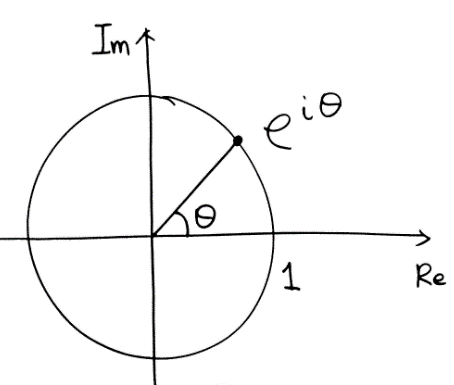

<center>
$\quad e^{i\theta}: \text{point on the unit circle with angle of}\ \theta \\ \quad e^{i\theta} = e^{i(\theta + 2\pi)} =\ ...\ =e^{i(\theta + 2\pi k)} =\ ...\\ \qquad \text{static}$
</center>

#### 2.2.2. Geometrical Meaning of $e^{iwt}$


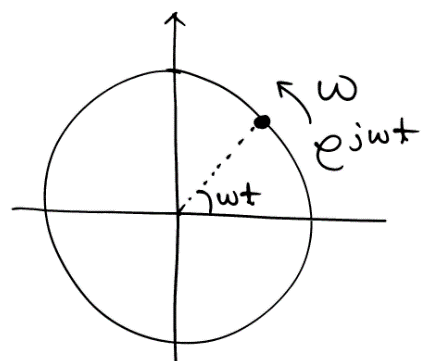

<center>
 <span class="math inline">\(\quad \theta = wt = 2\pi ft \\ \quad e^{iwt} : \text{rotating on an unit circle with angular velocity of}\ w \\ \qquad \text{dynamic}\)</span>
</center>
Question: What is the physical meaning of $e^{-iwt}$

### 2.3. Sinusoidal Functions from Circular Motions (sin & cos)
  -- Real part (cos term) is the projection onto the $Re\{\}$ axis
  
  -- Imaginary part (sin term) is the projection onto the $Im\{\}$ axis

$\text{projection of}\ e^{jwt}\ \text{onto Re-axis}$            | $\text{projection of} e^{jwt}\ \text{onto Im-axis}$
--------------------------------------------------- | ---------------------------------------------------
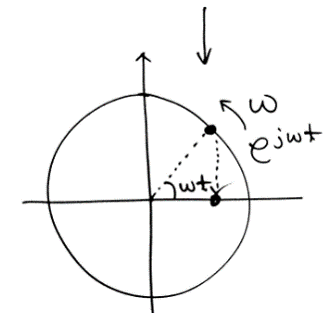</img>  | 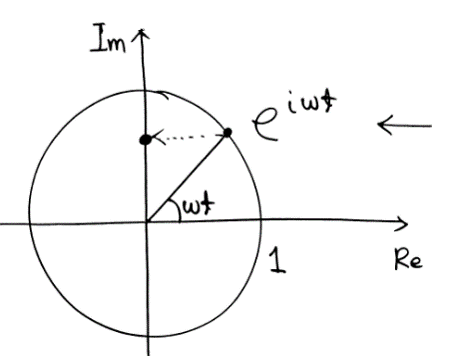</img>
$\text{Re}\left(e^{iwt}\right) = \text{cos}wt$                    | $\text{Im}\left(e^{iwt}\right) = \text{sin}wt$

<center>
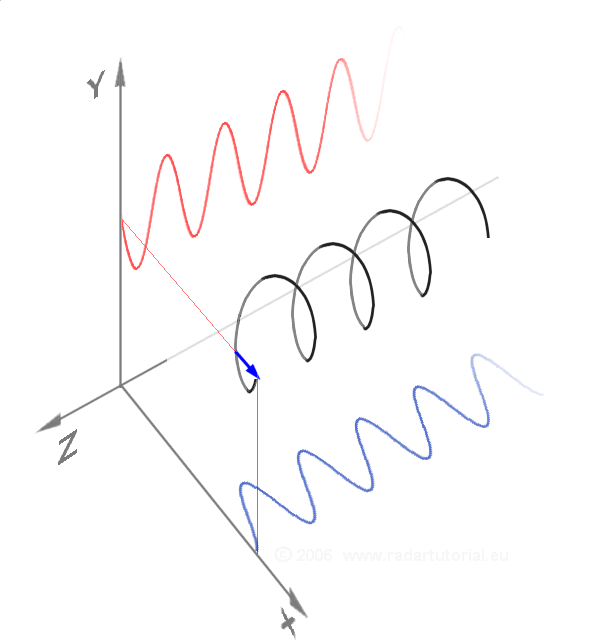
</center>

- Animated explanation of
$$
\text{cos}wt = {e^{iwt} + e^{-iwt} \over 2}
$$

<center>
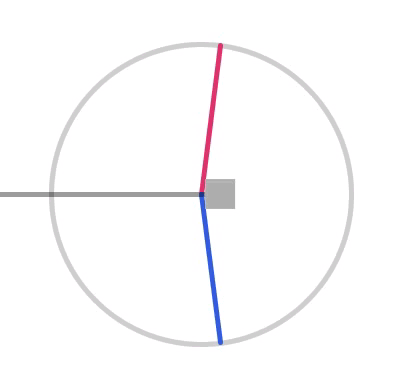
</center>

## 3. Discrete Sinusoids

$$e^{j(wn+\phi)} = \text{cos}(wn + \phi ) + j\text{sin}(wn + \phi)$$

Discrete Sinusoids

$$
x[n] = \text{Acos}(w_0n + \phi)\quad \text{or}\\
x[n] = \text{A}e^{jw_0n + j\phi} \qquad \qquad \ \ 
$$

__Key question: Which one is a higher frequency?__

$$w_0 = \pi \quad \text{or} \quad w_0 = {3\pi \over 2}$$


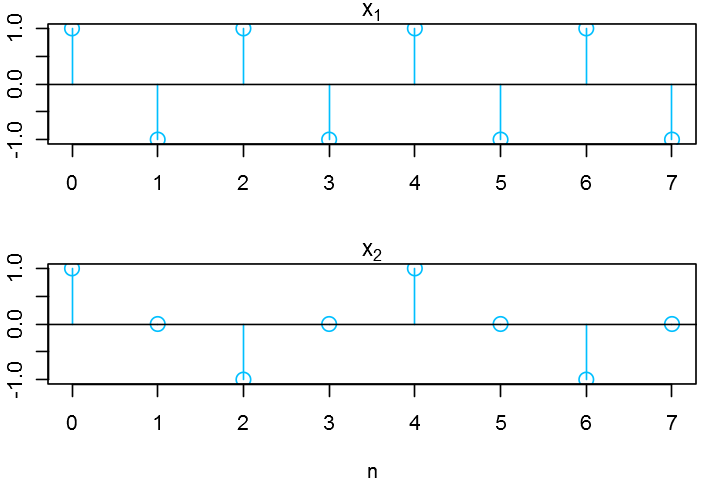

In [8]:
n <- 0:7
x1 <- cos(pi * n)
x2 <- cos(3/2 * pi * n)

par(mfrow = c(2, 1), mar = c(4, 2, 1, 1))
plot(n, x1, col = 'deepskyblue', cex = 1.5, main = expression(x[1]), xlab = "")
arrows(x0 = n, y0 = 0, x1 = n, y1 = x1, col = 'deepskyblue', length = 0, angle = 0, lwd = 1)
abline(h = 0)

plot(n, x2, col = 'deepskyblue', cex = 1.5, main = expression(x[2]))
arrows(x0 = n, y0 = 0, x1 = n, y1 = x2, col = 'deepskyblue', length = 0, angle = 0, lwd = 1)
abline(h = 0)

### 3.1. Frequency in Discrete Sinusoids

$$
0 \rightarrow {1 \over 8 }\pi \rightarrow {2 \over 8 }\pi \rightarrow{8 \over 8 }\pi
$$

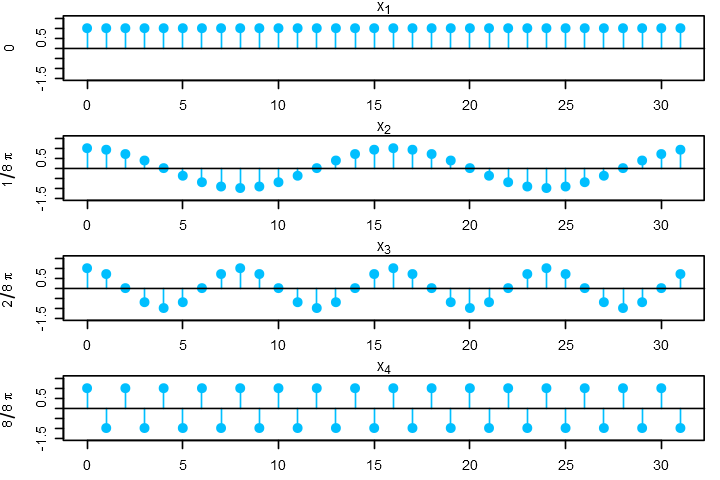

In [9]:
n <- 0:31
x1 <- cos(0 * pi * n)
x2 <- cos(1/8 * pi * n)
x3 <- cos(2/8 * pi * n)
x4 <- cos(1 * pi * n)

par(mfrow = c(4, 1), mar = c(2.5, 4, 1, 1))
plot(n, x1, col = 'deepskyblue', pch = 16, cex = 1.5, main = expression(x[1]),
     xlim = c(0, 31), ylim = c(-1.5, 1.5), ylab = '0')
arrows(x0 = n, y0 = 0, x1 = n, y1 = x1, col = 'deepskyblue', length = 0, angle = 0, lwd = 1)
abline(h = 0)

plot(n, x2, col = 'deepskyblue', pch = 16, cex = 1.5, main = expression(x[2]),
     xlim = c(0, 31), ylim = c(-1.5, 1.5), ylab = expression(1/8 ~ pi))
arrows(x0 = n, y0 = 0, x1 = n, y1 = x2, col = 'deepskyblue', length = 0, angle = 0, lwd = 1)
abline(h = 0)

plot(n, x3, col = 'deepskyblue', pch = 16, cex = 1.5, main = expression(x[3]),
     xlim = c(0, 31), ylim = c(-1.5, 1.5), ylab = expression(2/8 ~ pi))
arrows(x0 = n, y0 = 0, x1 = n, y1 = x3, col = 'deepskyblue', length = 0, angle = 0, lwd = 1)
abline(h = 0)

plot(n, x4, col = 'deepskyblue', pch = 16, cex = 1.5, main = expression(x[4]),
     xlim = c(0, 31), ylim = c(-1.5, 1.5), ylab = expression(8/8 ~ pi))
arrows(x0 = n, y0 = 0, x1 = n, y1 = x4, col = 'deepskyblue', length = 0, angle = 0, lwd = 1)
abline(h = 0)

$$
2\pi \rightarrow {15 \over 8 }\pi \rightarrow {14 \over 8 }\pi \rightarrow{8 \over 8 }\pi
$$

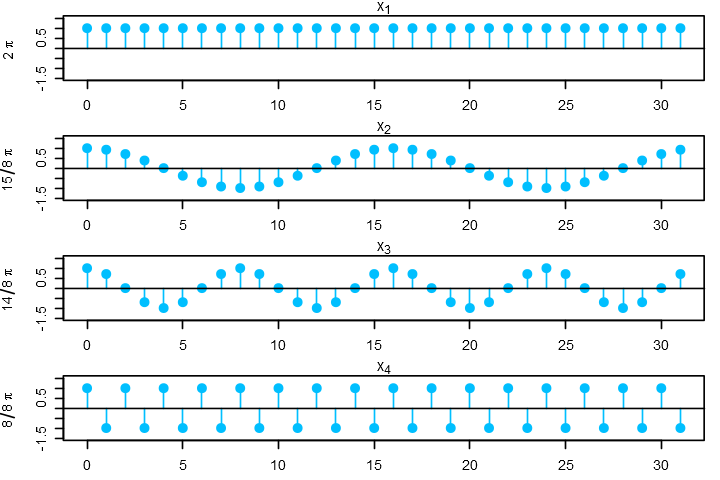

In [10]:
n <- 0:31
x5 <- cos(2 * pi * n)
x6 <- cos(15/8 * pi * n)
x7 <- cos(14/8 * pi * n)
x8 <- cos(1 * pi * n)

par(mfrow = c(4, 1), mar = c(2.5, 4, 1, 1))
plot(n, x5, col = 'deepskyblue', pch = 16, cex = 1.5, main = expression(x[1]),
     xlim = c(0, 31), ylim = c(-1.5, 1.5), ylab = expression(2 ~ pi))
arrows(x0 = n, y0 = 0, x1 = n, y1 = x5, col = 'deepskyblue', length = 0, angle = 0, lwd = 1)
abline(h = 0)

plot(n, x6, col = 'deepskyblue', pch = 16, cex = 1.5, main = expression(x[2]),
     xlim = c(0, 31), ylim = c(-1.5, 1.5), ylab = expression(15/8 ~ pi))
arrows(x0 = n, y0 = 0, x1 = n, y1 = x6, col = 'deepskyblue', length = 0, angle = 0, lwd = 1)
abline(h = 0)

plot(n, x7, col = 'deepskyblue', pch = 16, cex = 1.5, main = expression(x[3]),
     xlim = c(0, 31), ylim = c(-1.5, 1.5), ylab = expression(14/8 ~ pi))
arrows(x0 = n, y0 = 0, x1 = n, y1 = x7, col = 'deepskyblue', length = 0, angle = 0, lwd = 1)
abline(h = 0)

plot(n, x8, col = 'deepskyblue', pch = 16, cex = 1.5, main = expression(x[4]),
     xlim = c(0, 31), ylim = c(-1.5, 1.5), ylab = expression(8/8 ~ pi))
arrows(x0 = n, y0 = 0, x1 = n, y1 = x8, col = 'deepskyblue', length = 0, angle = 0, lwd = 1)
abline(h = 0)

### 3.2. Aliasing

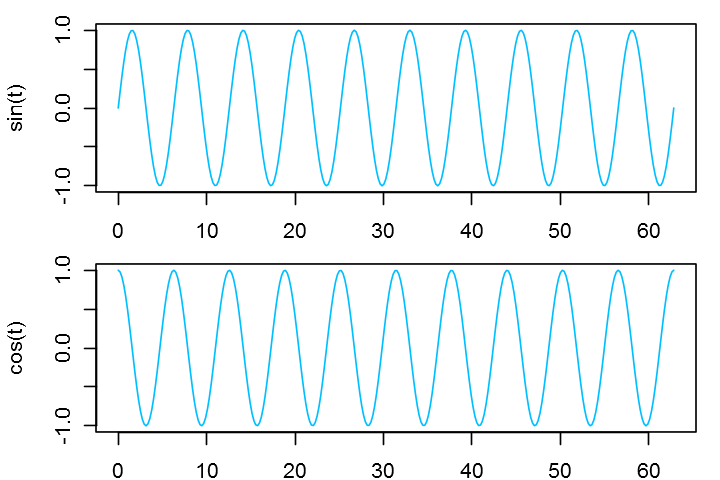

In [11]:
t <- seq(0, 10 * 2 * pi, length.out = 300)
x <- sin(t)
y <- cos(t)

par(mfrow = c(2, 1), mar = c(2, 4, 1, 1))
plot(t, x, col = 'deepskyblue', type = 'l', lwd = 1, main = "", ylab = 'sin(t)')
plot(t, y, col = 'deepskyblue', type = 'l', lwd = 1, main = "", ylab = 'cos(t)')

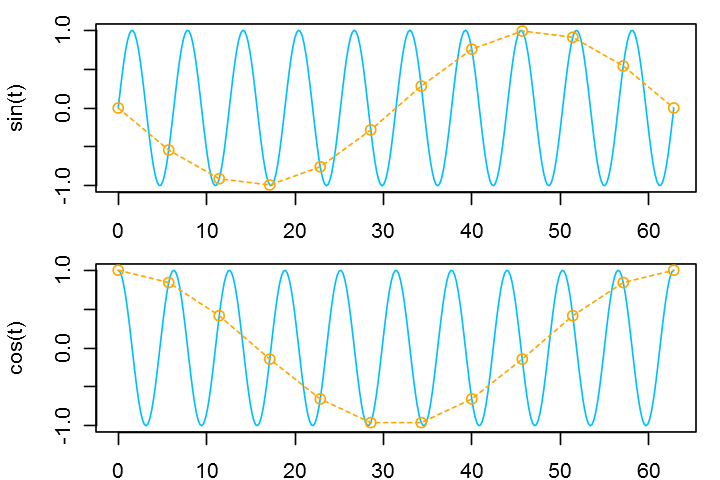

In [12]:
ts <- seq(0, 10 * 2 * pi, length.out = 12)
xs <- sin(ts)
ys <- cos(ts)

par(mfrow = c(2, 1), mar = c(2, 4, 1, 1))
plot(t, x, col = 'deepskyblue', type = 'l', lwd = 1, main = "", ylab = 'sin(t)')
lines(ts, xs, col = 'orange', type = 'o', lwd = 1, lty = 2)
plot(t, y, col = 'deepskyblue', type = 'l', lwd = 1, main = "", ylab = 'cos(t)')
lines(ts, ys, col = 'orange', type = 'o', lwd = 1, lty = 2)

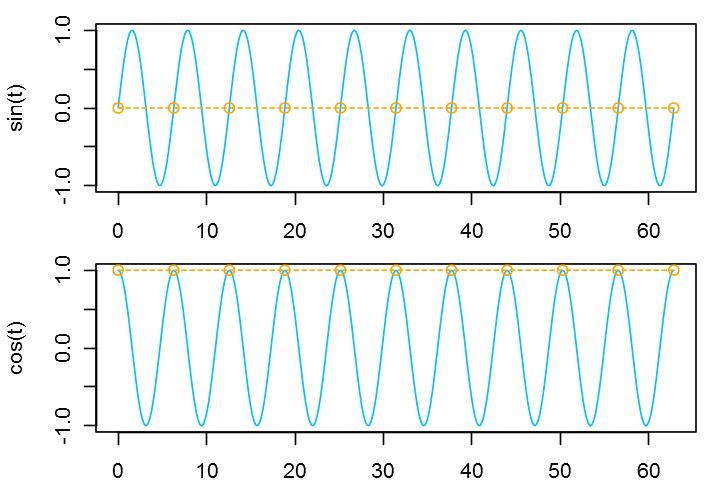

In [13]:
ts <- seq(0, 10 * 2 * pi, length.out = 11)
xs <- sin(ts)
ys <- cos(ts)

par(mfrow = c(2, 1), mar = c(2, 4, 1, 1))
plot(t, x, col = 'deepskyblue', type = 'l', lwd = 1, main = "", ylab = 'sin(t)')
lines(ts, xs, col = 'orange', type = 'o', lwd = 1, lty = 2)
plot(t, y, col = 'deepskyblue', type = 'l', lwd = 1, main = "", ylab = 'cos(t)')
lines(ts, ys, col = 'orange', type = 'o', lwd = 1, lty = 2)

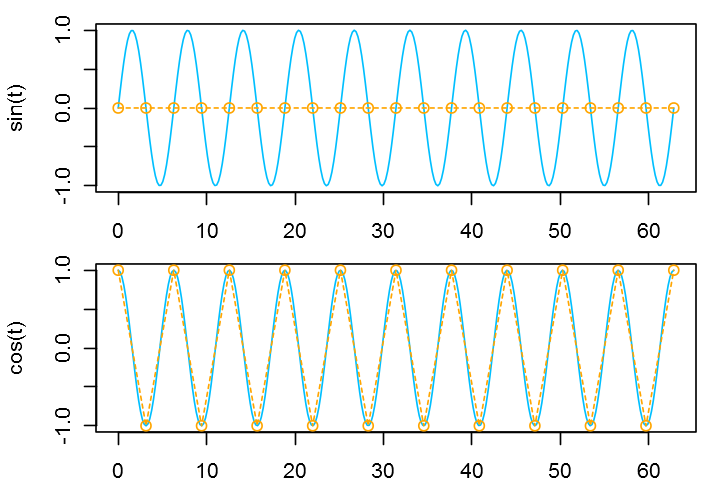

In [14]:
ts <- seq(0, 10 * 2 * pi, length.out = 21)
xs <- sin(ts)
ys <- cos(ts)

par(mfrow = c(2, 1), mar = c(2, 4, 1, 1))
plot(t, x, col = 'deepskyblue', type = 'l', lwd = 1, main = "", ylab = 'sin(t)')
lines(ts, xs, col = 'orange', type = 'o', lwd = 1, lty = 2)
plot(t, y, col = 'deepskyblue', type = 'l', lwd = 1, main = "", ylab = 'cos(t)')
lines(ts, ys, col = 'orange', type = 'o', lwd = 1, lty = 2)


***
<center><iframe 
width="560" height="315" src="https://www.youtube.com/embed/jHS9JGkEOmA?rel=0" frameborder="0" allowfullscreen>
</iframe></center>
***

## 4. Complex Exponential Signals

### 4.1. Damped Free Oscillation
***
<center><iframe src="https://www.youtube.com/embed/vDulP6vTa9g?rel=0" 
width="560" height="315" frameborder="0" allowfullscreen></iframe></center>
***

$$
x[n] = e^{-{n \over N}}e^{j{2\pi \over N}n}
$$

In [15]:
# real and image parts
N <- 20
n <- 0:(2 * N - 1)
x <- exp(-n/N) * exp(complex(imaginary = 2 * pi / N * n))

__1) rectanglar form__

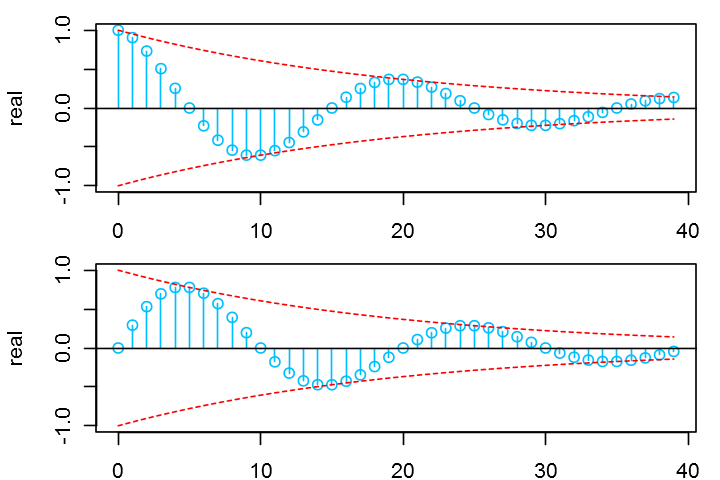

In [16]:
par(mfrow = c(2, 1), mar = c(2, 4, 1, 1))
plot(n, Re(x), col = 'deepskyblue', cex = 1, main = '', ylim = c(-1, 1), ylab = 'real')
arrows(x0 = n, y0 = 0, x1 = n, y1 = Re(x), col = 'deepskyblue', length = 0, angle = 0, lwd = 1)
abline(h = 0)
matlines(x = n, y = cbind(1 * exp(-n / N), -1 * exp(-n / N)), type = 'l', lwd = 1, lty = 2, col = 'red')

plot(n, Im(x), col = 'deepskyblue', cex = 1, main = '', ylim = c(-1, 1), ylab = 'real')
arrows(x0 = n, y0 = 0, x1 = n, y1 = Im(x), col = 'deepskyblue', length = 0, angle = 0, lwd = 1)
abline(h = 0)
matlines(x = n, y = cbind(1 * exp(-n / N), -1 * exp(-n / N)), type = 'l', lwd = 1, lty = 2, col = 'red')

In [17]:
suppressPackageStartupMessages(library(plotly))
plot_ly(x = ~n, y = ~Re(x), z = ~Im(x), type = "scatter3d", mode = "markers")

HTML widgets cannot be represented in plain text (need html)

__2) polar form__
$$
x[n] = e^{-{n \over N}}e^{j{2\pi \over N}n} \\ = |x[n]|e^{j\angle x[n]}
$$

In [18]:
# polar coordinate
plot_ly(theta = ~Arg(x)/pi*180, r = ~Mod(x), type = 'scatterpolar', mode = "markers")

HTML widgets cannot be represented in plain text (need html)